# Autoencoder with MNIST

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets
import torch.optim as optim
from torchvision.transforms import transforms
from torchvision.utils import save_image

import numpy as np
import matplotlib.pyplot as plt

In [11]:
lr = 0.001
batch_size = 100
epochs = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
'''
Step 1:
'''

# MNIST dataset
dataset = datasets.MNIST(root='./mnist_data/',
                               train=True, 
                               transform=transforms.ToTensor(),
                               download=True)

train_dataset, validation_dataset = torch.utils.data.random_split(dataset, [50000, 10000])

test_dataset = datasets.MNIST(root='./mnist_data/',
                              train=False, 
                              transform=transforms.ToTensor())

In [13]:
'''
Step 2: AutoEncoder
'''
# Define Encoder
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(784, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 32)
    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        z = F.relu(self.fc3(x))
        return z

# Define Decoder
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(32, 128)
        self.fc2 = nn.Linear(128, 256)
        self.fc3 = nn.Linear(256, 784)
    def forward(self, z):
        z = F.relu(self.fc1(z))
        z = F.relu(self.fc2(z))
        x = F.sigmoid(self.fc3(z))  # to make output's pixels are 0~1
        x = x.view(x.size(0), 1, 28, 28) 
        return x

In [14]:
'''
Step 3: Instantiate model & define loss and optimizer
'''
enc = Encoder().to(device)
dec = Decoder().to(device)
loss_function = nn.MSELoss()
optimizer = optim.Adam(list(enc.parameters()) + list(dec.parameters()), lr=lr)

In [15]:
'''
Step 4: Training
'''
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)


train_loss_list = []

import time
start = time.time()
for epoch in range(epochs) :
    print("{}th epoch starting.".format(epoch))
    enc.train()
    dec.train()
    for batch, (images, _) in enumerate(train_loader) :
        images = images.to(device)
        z = enc(images)
        reconstructed_images = dec(z)
        
        optimizer.zero_grad()
        train_loss = loss_function(images, reconstructed_images)
        train_loss.backward()
        train_loss_list.append(train_loss.item())

        optimizer.step()

        print(f"[Epoch {epoch:3d}] Processing batch #{batch:3d} reconstruction loss: {train_loss.item():.6f}", end='\r')
end = time.time()
print("Time ellapsed in training is: {}".format(end - start))

0th epoch starting.
1th epoch starting.ing batch #499 reconstruction loss: 0.034450
2th epoch starting.ing batch #499 reconstruction loss: 0.024359
3th epoch starting.ing batch #499 reconstruction loss: 0.019667
4th epoch starting.ing batch #499 reconstruction loss: 0.017947
5th epoch starting.ing batch #499 reconstruction loss: 0.015627
6th epoch starting.ing batch #499 reconstruction loss: 0.014803
7th epoch starting.ing batch #499 reconstruction loss: 0.013882
8th epoch starting.ing batch #499 reconstruction loss: 0.012854
9th epoch starting.ing batch #499 reconstruction loss: 0.014836
10th epoch starting.ng batch #499 reconstruction loss: 0.010564
11th epoch starting.ng batch #499 reconstruction loss: 0.010843
12th epoch starting.ng batch #499 reconstruction loss: 0.012298
13th epoch starting.ng batch #499 reconstruction loss: 0.010298
14th epoch starting.ng batch #499 reconstruction loss: 0.009564
Time ellapsed in training is: 337.26505517959595 loss: 0.010045


In [16]:
'''
Step 5: Calculate standard deviation by using validation set
'''
validation_loader = torch.utils.data.DataLoader(dataset=validation_dataset, batch_size=batch_size)

enc.eval()
dec.eval()
loss_mean = 0
for batch, (images, _) in enumerate(validation_loader):
    images = images.to(device)
    z = enc(images)
    reconstructed_images = dec(z)
    error = (images - reconstructed_images)**2
    error = torch.mean(error)

    loss_mean += error

loss_mean = loss_mean/(len(validation_dataset)//batch_size)
print(f"Validation Loss #{loss_mean.item(): .6f}", end='\r')

In [17]:
'''
Step 6: Select same labels and different labels
'''

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=1)

want_label = 4
different_label = 1
select_1, select_2, select_3 = None, None, None

for img, label in test_loader:
    if select_3 is None:
        if label == different_label:
            select_3 = img
            continue
    if select_1 is None:
        if label == want_label:
            select_1 = img
            continue
        
    else:
        if label == want_label:
            select_2 = img
            break

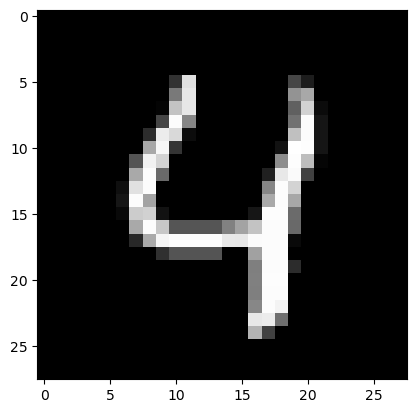

In [18]:
'''
First same label image
'''
plt.imshow(transforms.ToPILImage()(select_1.squeeze(0)), cmap='gray')

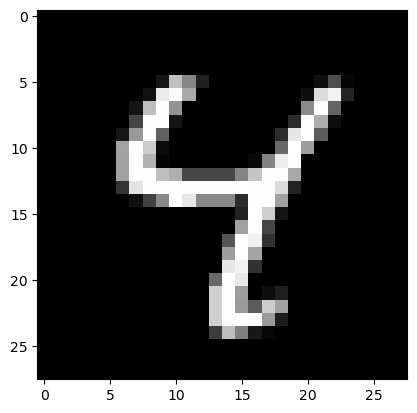

In [19]:
'''
Second same label image
'''
plt.imshow(transforms.ToPILImage()(select_2.squeeze(0)), cmap='gray')

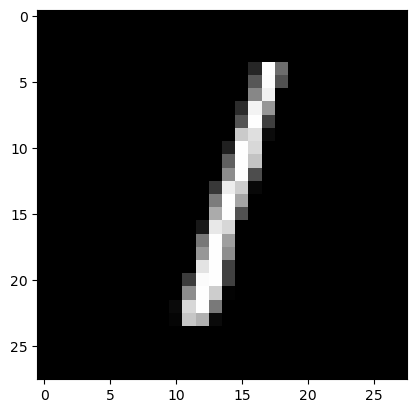

In [20]:
'''
Different label image
'''
plt.imshow(transforms.ToPILImage()(select_3.squeeze(0)), cmap='gray')

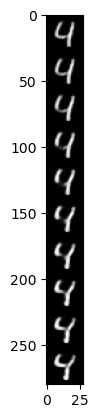

In [21]:
'''
Interpolating same labels in latent space
'''
z1 = enc(select_1.to(device))
z2 = enc(select_2.to(device))

z = torch.zeros(10,32).to(device)

for i in range(0,10):
    z[i] = (1-i/9)*z1 + (i/9)*z2
    
out = dec(z)
out = out.view(280, 28)

plt.imshow(transforms.ToPILImage()(out), cmap='gray')

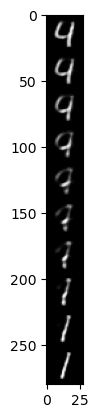

In [22]:
'''
Interpolating different labels in latent space
'''

z3 = enc(select_3.to(device))

z = torch.zeros(10,32).to(device)

for i in range(0,10):
    z[i] = (1-i/9)*z1 + (i/9)*z3

out = dec(z)
out = out.view(280, 28)

plt.imshow(transforms.ToPILImage()(out), cmap='gray')

# 1-d Flow

Flow with mixture of normal-CDF. Define
$$
\Phi_{\mu,\sigma}(x)=\frac{1}{\sigma\sqrt{2\pi}}\int^x_{-\infty}\exp\left(-\frac{1}{2}\left(\frac{s-\mu}{\sigma}\right)^2\right)\;ds.
$$
We use the flow
$$
f_\theta(x)=\sum^n_{i=1}\frac{e^{w_i}}{\sum^n_{j=1}e^{w_j}}\Phi_{\mu_i,\exp(\tau_i)}(x),
$$
where $\theta=(w_1,\dots,w_n,\mu_1,\dots,\mu_n,\tau_1,\dots,\tau_n)$. Note that $f_\theta\colon \mathbb{R}\rightarrow (0,1)$.

In [24]:
import torch
import torch.utils.data as data 
import torch.nn as nn
from torch.distributions.normal import Normal 
from torch.distributions.uniform import Uniform
import numpy as np
import matplotlib.pyplot as plt


epochs = 50
learning_rate = 5e-3
batch_size = 128
n_components=5 # the number of kernel
target_distribution = Uniform(0.0, 1.0)



####################################
# STEP 1: Implement 1-d Flow model #
# Model is misture of Gaussian CDFs
#
####################################
class Flow1d(nn.Module):
    def __init__(self, n_components):
        super(Flow1d, self).__init__()
        self.mus = nn.Parameter(torch.randn(n_components), requires_grad=True)
        self.log_sigmas = nn.Parameter(torch.zeros(n_components), requires_grad=True)
        self.weight_logits = nn.Parameter(torch.ones(n_components), requires_grad=True)

    def forward(self, x):
        x = x.view(-1,1)
        weights = self.weight_logits.softmax(dim=0).view(1,-1)
        distribution = Normal(self.mus, self.log_sigmas.exp())
        z = (distribution.cdf(x) * weights).sum(dim=1)
        dz_by_dx = (distribution.log_prob(x).exp() * weights).sum(dim=1)
        return z, dz_by_dx
    
################################################
# STEP 2: Create Dataset and Create Dataloader #
################################################ 

def mixture_of_gaussians(num, mu_var=(-1,0.25, 0.2,0.25, 1.5,0.25)):
    n = num // 3
    m1,s1,m2,s2,m3,s3 = mu_var
    gaussian1 = np.random.normal(loc=m1, scale=s1, size=(n,))
    gaussian2 = np.random.normal(loc=m2, scale=s2, size=(n,))
    gaussian3 = np.random.normal(loc=m3, scale=s3, size=(num-n,))
    return np.concatenate([gaussian1, gaussian2, gaussian3])

class MyDataset(data.Dataset):
    def __init__(self, array):
        super().__init__()
        self.array = array

    def __len__(self):
        return len(self.array)

    def __getitem__(self, index):
        return self.array[index]
    
################################
# STEP 3: Define Loss Function #
################################
def loss_function(target_distribution, z, dz_by_dx):
    # log(p_Z(z)) = target_distribution.log_prob(z)
    # log(dz/dx) = dz_by_dx.log() (flow is defined so that dz/dx>0)
    log_likelihood = target_distribution.log_prob(z) + dz_by_dx.log()
    return -log_likelihood.mean()  #flip sign, and sum of data X_1,...X_N
    
###########################
# STEP 4: Train the model #
########################### 

# create dataloader
n_train, n_test = 5000, 1000
train_data = mixture_of_gaussians(n_train)
test_data = mixture_of_gaussians(n_test)

train_loader = data.DataLoader(MyDataset(train_data), batch_size=batch_size, shuffle=True)
test_loader = data.DataLoader(MyDataset(test_data), batch_size=batch_size, shuffle=True)

# create model
flow = Flow1d(n_components)
optimizer = torch.optim.Adam(flow.parameters(), lr=learning_rate)

train_losses, test_losses = [], []

for epoch in range(epochs):
    # train
    flow.train()
    mean_loss = 0
    for i, x in enumerate(train_loader):
        z, dz_by_dx = flow(x)
        loss = loss_function(target_distribution, z, dz_by_dx)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        mean_loss += loss.item()
    train_losses.append(mean_loss/(i+1))

    # test
    flow.eval()
    mean_loss = 0
    for i, x in enumerate(test_loader):
        z, dz_by_dx = flow(x)
        loss = loss_function(target_distribution, z, dz_by_dx)

        mean_loss += loss.item()
    test_losses.append(mean_loss/(i+1))

# Visualize training and test data

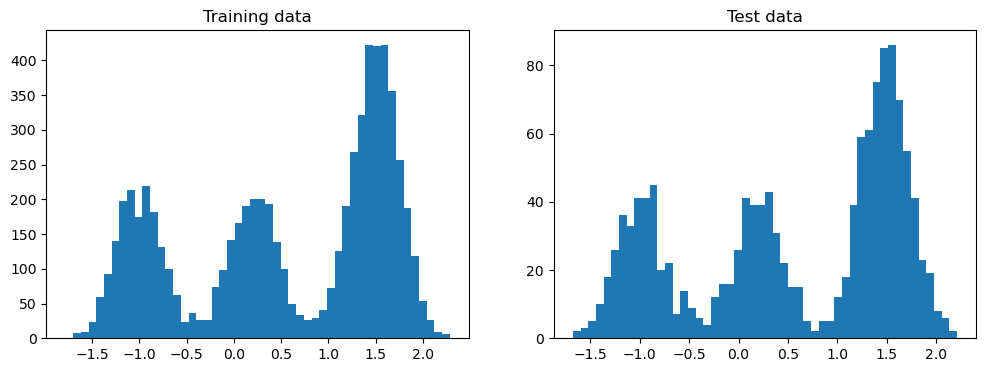

In [25]:
_, axes = plt.subplots(1,2, figsize=(12,4))
_ = axes[0].hist(train_loader.dataset.array, bins=50)
_ = axes[1].hist(test_loader.dataset.array, bins=50)
_ = axes[0].set_title('Training data')
_ = axes[1].set_title('Test data')

# View training and test loss

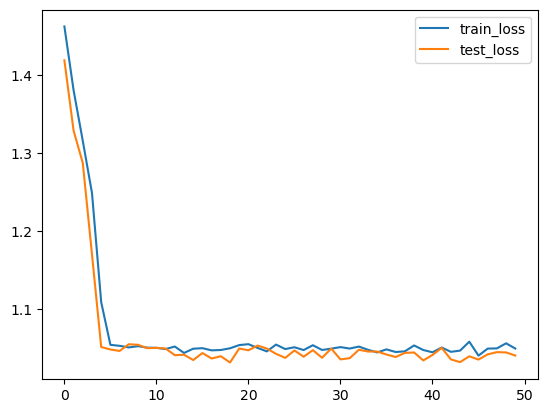

In [26]:
plt.plot(train_losses, label='train_loss')
plt.plot(test_losses, label='test_loss')
plt.legend()

# View learned distribution and flow map

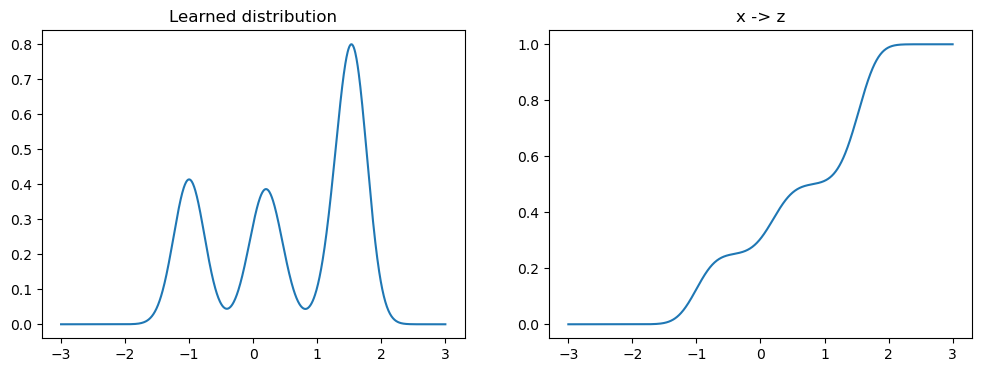

In [27]:
x = np.linspace(-3,3,1000)
with torch.no_grad():
    z, dz_by_dx = flow(torch.FloatTensor(x))
    px = (target_distribution.log_prob(z) + dz_by_dx.log()).exp().cpu().numpy()
    
_, axes = plt.subplots(1,2, figsize=(12,4))
_ = axes[0].plot(x,px)
_ = axes[0].set_title('Learned distribution')

_ = axes[1].plot(x,z)
_ = axes[1].set_title('x -> z')

# View learned $p_Z$, which is trained to be Uniform([0,1]).

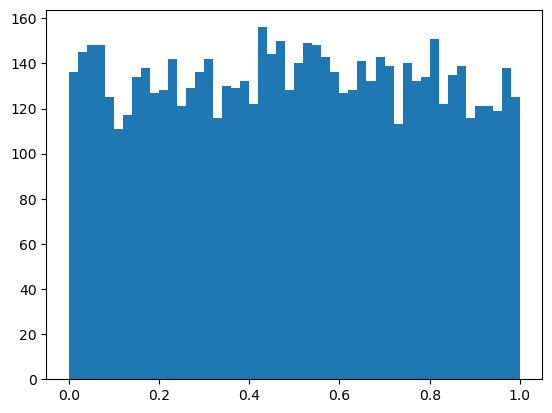

In [28]:
with torch.no_grad():
    z, _ = flow(torch.FloatTensor(train_loader.dataset.array))
    
_ = plt.hist(np.array(z), bins=50)

# Sampling X
This requires solving for `flow(x)=z`

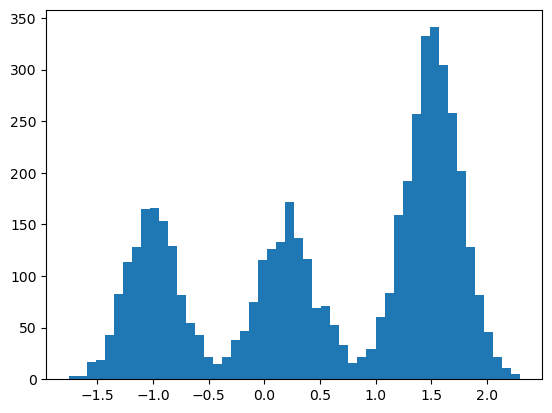

In [29]:
# sampling

N = 5000
z = torch.rand(N)
x_low = torch.full((N,), -3.)
x_high = torch.full((N,), 3.)

#Perform bisection
with torch.no_grad():
    for _ in range(30):
        m = (x_low+x_high)/2
        f,_ = flow(m)
        x_high[f>=z] = m[f>=z]
        x_low[f<z] = m[f<z]
    x = (x_low+x_high)/2

_ = plt.hist(np.array(x), bins=50)


# NICE (MNIST)

Logisic ditribution prior used
$$
p_Z(z)=\frac{1}{(1+e^{-x})(1+e^{x})}=\frac{e^x}{(1+e^x)^2}=\frac{e^{-x}}{(1+e^{-
x})^2}\\
p_Z(z)=-\log(1+e^z)-\log(1+e^{-z})\\
F_Z(t)=\int^t_{-\infty}p_Z(z)\;dz=\frac{1}{1+e^{-t}}
$$


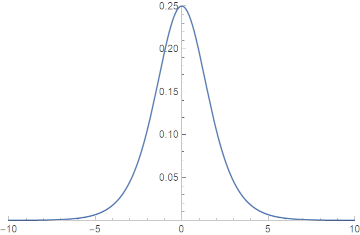

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1th epoch, loss_mean tensor(915.9362, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5th epoch, loss_mean tensor(-415.0193, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10th epoch, loss_mean tensor(-1384.8141, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


20th epoch, loss_mean tensor(-2082.6462, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


50th epoch, loss_mean tensor(-2274.6387, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


90th epoch, loss_mean tensor(-2334.6213, device='cuda:0', grad_fn=<DivBackward0>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


100th epoch, loss_mean tensor(-2347.3162, device='cuda:0', grad_fn=<DivBackward0>)


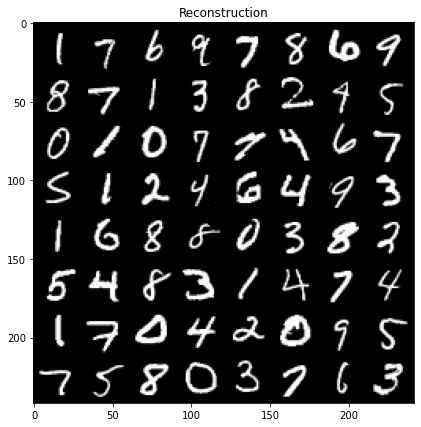

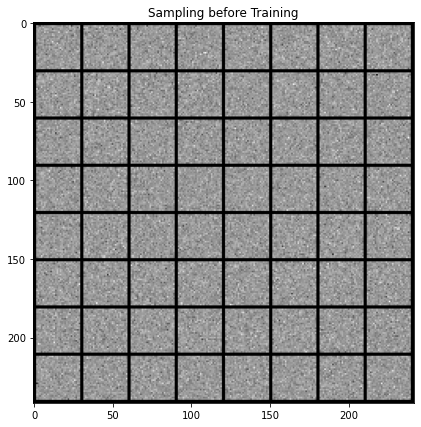

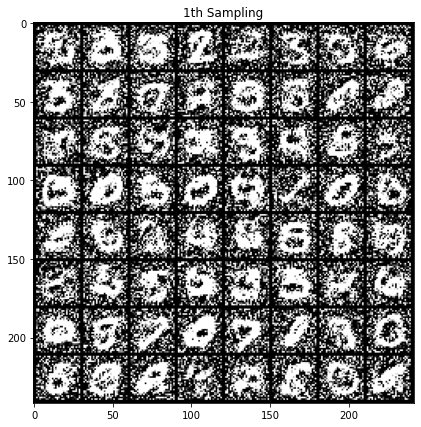

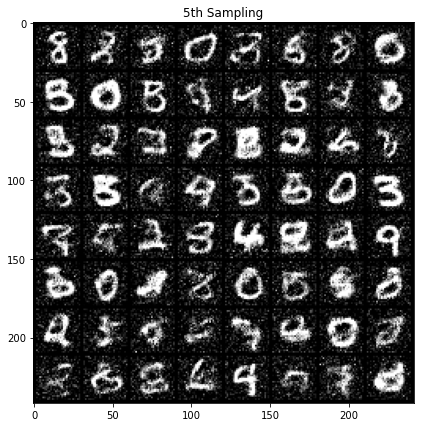

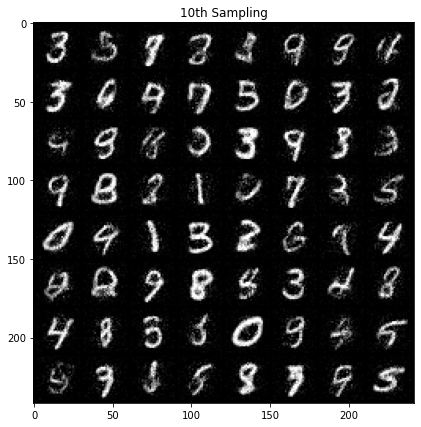

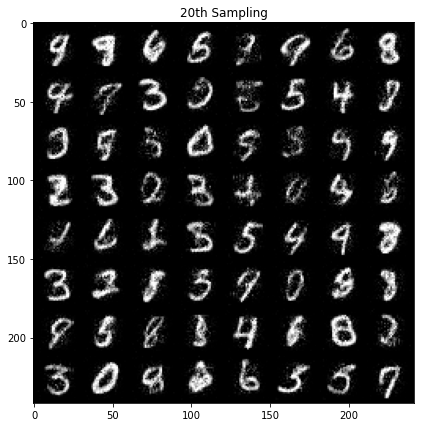

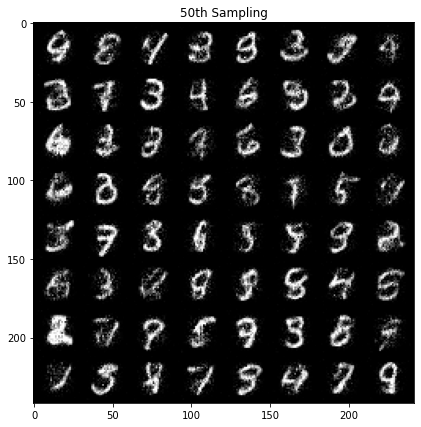

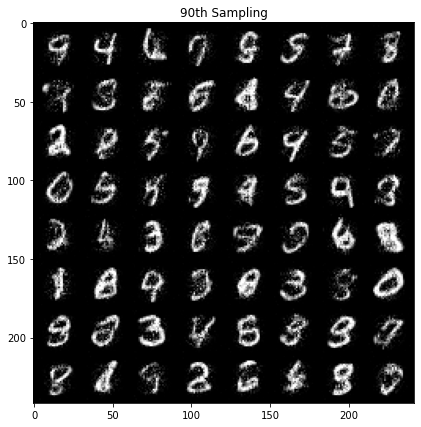

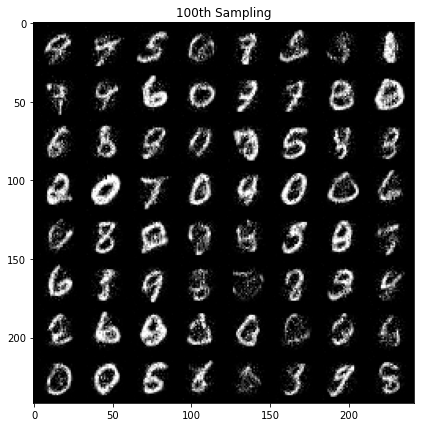

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid

import numpy as np
import matplotlib.pyplot as plt

batch_size = 128
(full_dim, mid_dim, hidden) = (1 * 28 * 28, 1000, 5)
lr = 1e-3
epochs = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


############################################
# STEP 1: Define dataset and preprocessing #
############################################

trainset = torchvision.datasets.MNIST(root='./', train=True, download=True, transform=torchvision.transforms.ToTensor())
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

#####################################
# STEP 2: Define prior distribution #
#####################################

class Logistic(torch.distributions.Distribution):
    def __init__(self):
        super(Logistic, self).__init__()

    def log_prob(self, x):
        return -(F.softplus(x) + F.softplus(-x))

    def sample(self, size):
        z = torch.distributions.Uniform(0., 1.).sample(size).to(device)
        return torch.log(z) - torch.log(1. - z)
    
####################################
# STEP 3: Implement Coupling Layer #
####################################

class Coupling(nn.Module):
    def __init__(self, in_out_dim, mid_dim, hidden, mask_config):
        super(Coupling, self).__init__()
        self.mask_config = mask_config
        
        self.in_block = nn.Sequential(nn.Linear(in_out_dim//2, mid_dim), nn.ReLU())
        self.mid_block = nn.ModuleList([nn.Sequential(nn.Linear(mid_dim, mid_dim), nn.ReLU())
                                                                 for _ in range(hidden - 1)])
        self.out_block = nn.Linear(mid_dim, in_out_dim//2)

    def forward(self, x, reverse=False):
        [B, W] = list(x.size())
        x = x.reshape((B, W//2, 2))
        if self.mask_config:
            on, off = x[:, :, 0], x[:, :, 1]
        else:
            off, on = x[:, :, 0], x[:, :, 1]

        off_ = self.in_block(off)
        for i in range(len(self.mid_block)):
            off_ = self.mid_block[i](off_)
        shift = self.out_block(off_)
        
        if reverse:
            on = on - shift
        else:
            on = on + shift

        if self.mask_config:
            x = torch.stack((on, off), dim=2)
        else:
            x = torch.stack((off, on), dim=2)
        return x.reshape((B, W))

class Scaling(nn.Module):
    def __init__(self, dim):
        super(Scaling, self).__init__()
        self.scale = nn.Parameter(torch.zeros((1, dim)), requires_grad=True)

    def forward(self, x, reverse=False):
        log_det_J = torch.sum(self.scale)
        if reverse:
            x = x * torch.exp(-self.scale)
        else:
            x = x * torch.exp(self.scale)
        return x, log_det_J
    
##########################
# STEP 4: Implement NICE #
##########################

class NICE(nn.Module):
    def __init__(self,in_out_dim, mid_dim, hidden, mask_config=1.0, coupling=4):
        super(NICE, self).__init__()
        self.prior = Logistic()
        self.in_out_dim = in_out_dim

        self.coupling = nn.ModuleList([
            Coupling(in_out_dim=in_out_dim, 
                     mid_dim=mid_dim, 
                     hidden=hidden, 
                     mask_config=(mask_config+i)%2) \
            for i in range(coupling)])
        
        self.scaling = Scaling(in_out_dim)

    def g(self, z):
        x, _ = self.scaling(z, reverse=True)
        for i in reversed(range(len(self.coupling))):
            x = self.coupling[i](x, reverse=True)
        return x

    def f(self, x):
        for i in range(len(self.coupling)):
            x = self.coupling[i](x)
        z, log_det_J = self.scaling(x)
        return z, log_det_J

    def log_prob(self, x):
        z, log_det_J = self.f(x)
        log_ll = torch.sum(self.prior.log_prob(z), dim=1)
        return log_ll + log_det_J

    def sample(self, size):
        z = self.prior.sample((size, self.in_out_dim)).to(device)
        return self.g(z)

    def forward(self, x):
        return self.log_prob(x)

    
'''
Instantiate model & define optimizer
'''

nice = NICE(in_out_dim=784, mid_dim=1000, hidden=5).to(device)

optimizer = torch.optim.Adam(nice.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-4)



'''
Visualize reconstructed image & sampled image BEFORE TRAINING
'''

for i, data in enumerate(train_loader,1):   
    inputs, _ = data
    inputs = inputs.to(device)
#     inputs = dequantize(inputs)
    inputs = inputs.view(-1, 784)
    break
    
with torch.no_grad():
    z, _ = nice.f(inputs)
    reconst = nice.g(z)
    reconst = reconst.view(-1, 1, 28, 28)
    samples = nice.sample(64)
    samples = samples.view(-1, 1, 28, 28)
    save_image(reconst[:64], "before_training_reconstruction.png")
    save_image(samples, "before_training_sample.png")
    
    plt.figure(figsize = (7,7))
    plt.title('Reconstruction')
    plt.imshow(make_grid(reconst[:64].cpu(), normalize=True).permute(1,2,0))

    plt.figure(figsize = (7,7))
    plt.title('Sampling before Training')
    plt.imshow(make_grid(samples.cpu(), normalize=True).permute(1,2,0))
    
    
####################
# STEP 4: Training #
####################

for epoch in range(1,epochs+1):
    running_loss = 0
    for i, data in enumerate(train_loader,1):
        optimizer.zero_grad()    
        inputs, _ = data
        inputs = inputs.to(device)
#         inputs = dequantize(inputs)
        inputs = inputs.view(-1, 784)

        loss = -nice(inputs).mean()
        running_loss += loss

        loss.backward()
        optimizer.step()

    loss_mean = running_loss / (len(trainset)//batch_size)
    
    if epoch in [1,5,10,20,50,90,100]:
        print("{}th epoch, loss_mean".format(epoch), loss_mean)
        with torch.no_grad():
            z, _ = nice.f(inputs)
            samples = nice.sample(64)
            samples = samples.view(-1, 1, 28, 28)
            save_image(samples, "{}th_epoch_sample.png".format(epoch))
            samples = samples.view(-1, 1, 28, 28)
            plt.figure(figsize = (7,7))
            plt.title('{}th Sampling'.format(epoch))
            plt.imshow(make_grid(samples.cpu()).permute(1,2,0))

# RealNVP (CIFAR-HORSE)

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.optim as optim
import torch.distributions as distributions

import numpy as np
import matplotlib.pyplot as plt

In [2]:
device = torch.device('cuda:0')
batch_size = 64
learning_rate = 1e-3
epochs=100

In [3]:
####################################
# STEP 1: Implement Coupling Layer #
####################################

class AbstractCoupling(nn.Module):
    def __init__(self, mask_config):
        super(AbstractCoupling, self).__init__()
        self.mask_config = mask_config

    def build_mask(self, size, config=1.):
        mask = np.arange(size).reshape(-1, 1) + np.arange(size)
        mask = np.mod(config + mask, 2)
        mask = mask.reshape(-1, 1, size, size) 
        return torch.tensor(mask.astype('float32'))

    def batch_stat(self, x):
        mean = torch.mean(x, dim=(0, 2, 3), keepdim=True)
        var = torch.mean((x - mean)**2, dim=(0, 2, 3), keepdim=True)
        return mean, var


class CheckerboardAffineCoupling(AbstractCoupling):
    def __init__(self, in_out_dim, mid_dim, size, mask_config):

        super(CheckerboardAffineCoupling, self).__init__(mask_config)

        self.mask = self.build_mask(size, config=mask_config).cuda()
        self.scale = nn.Parameter(torch.zeros(1), requires_grad=True)
        self.scale_shift = nn.Parameter(torch.zeros(1), requires_grad=True)
        self.in_bn = nn.BatchNorm2d(in_out_dim)
        self.block = nn.Sequential(      
            nn.ReLU(),                   
            ResidualModule(in_out_dim, mid_dim, 2*in_out_dim))
        self.out_bn = nn.BatchNorm2d(in_out_dim, affine=False)

    def forward(self, x, reverse=False):
        [B, C, _, _] = list(x.size())
        mask = self.mask.repeat(B, 1, 1, 1)
        x_ = self.in_bn(x * mask)
        (shift, log_rescale) = self.block(x_).split(C, dim=1)
        log_rescale = self.scale * torch.tanh(log_rescale) + self.scale_shift
        shift = shift * (1. - mask)
        log_rescale = log_rescale * (1. - mask)
        
        log_diag_J = log_rescale
        
        if reverse:
            mean, var = self.out_bn.running_mean, self.out_bn.running_var
            mean = mean.reshape(-1, 1, 1, 1).transpose(0, 1)
            var = var.reshape(-1, 1, 1, 1).transpose(0, 1)
            x = x * torch.exp(0.5 * torch.log(var + 1e-5) * (1. - mask)) \
                + mean * (1. - mask)
            x = (x - shift) * torch.exp(-log_rescale)
        else:
            x = x * torch.exp(log_rescale) + shift
            if self.training:
                _, var = self.batch_stat(x)
            else:
                var = self.out_bn.running_var
                var = var.reshape(-1, 1, 1, 1).transpose(0, 1)
            x = self.out_bn(x) * (1. - mask) + x * mask
            log_diag_J = log_diag_J - 0.5 * torch.log(var + 1e-5) * (1. - mask) 
        return x, log_diag_J

class CheckerboardCoupling(nn.Module):
    def __init__(self, in_out_dim, mid_dim, size, mask_config):

        super(CheckerboardCoupling, self).__init__()

        self.coupling = CheckerboardAffineCoupling(
                in_out_dim, mid_dim, size, mask_config)

    def forward(self, x, reverse=False):
        return self.coupling(x, reverse)

class ChannelwiseAffineCoupling(AbstractCoupling):
    def __init__(self, in_out_dim, mid_dim, mask_config):
        super(ChannelwiseAffineCoupling, self).__init__(mask_config)

        self.scale = nn.Parameter(torch.zeros(1), requires_grad=True)
        self.scale_shift = nn.Parameter(torch.zeros(1), requires_grad=True)
        self.in_bn = nn.BatchNorm2d(in_out_dim//2)
        self.block = nn.Sequential(        # 1st half of resnet: shift
            nn.ReLU(),                    # 2nd half of resnet: log_rescale
            ResidualModule(in_out_dim//2, mid_dim, in_out_dim))
        self.out_bn = nn.BatchNorm2d(in_out_dim//2, affine=False)

    def forward(self, x, reverse=False):
        [_, C, _, _] = list(x.size())
        if self.mask_config:
            (on, off) = x.split(C//2, dim=1)
        else:
            (off, on) = x.split(C//2, dim=1)
        off_ = self.in_bn(off)
        out = self.block(off_)
        (shift, log_rescale) = out.split(C//2, dim=1)
        log_rescale = self.scale * torch.tanh(log_rescale) + self.scale_shift
        
        log_diag_J = log_rescale
        if reverse:
            mean, var = self.out_bn.running_mean, self.out_bn.running_var
            mean = mean.reshape(-1, 1, 1, 1).transpose(0, 1)
            var = var.reshape(-1, 1, 1, 1).transpose(0, 1)
            on = on * torch.exp(0.5 * torch.log(var + 1e-5)) + mean
            on = (on - shift) * torch.exp(-log_rescale)
        else:
            on = on * torch.exp(log_rescale) + shift
            if self.training:
                _, var = self.batch_stat(on)
            else:
                var = self.out_bn.running_var
                var = var.reshape(-1, 1, 1, 1).transpose(0, 1)
            on = self.out_bn(on)
            log_diag_J = log_diag_J - 0.5 * torch.log(var + 1e-5)
        if self.mask_config:
            x = torch.cat((on, off), dim=1)
            log_diag_J = torch.cat((log_diag_J, torch.zeros_like(log_diag_J)), 
                dim=1)
        else:
            x = torch.cat((off, on), dim=1)
            log_diag_J = torch.cat((torch.zeros_like(log_diag_J), log_diag_J), 
                dim=1)
        return x, log_diag_J

class ChannelwiseCoupling(nn.Module):
    def __init__(self, in_out_dim, mid_dim, mask_config):
        """
        in_out_dim: number of input and output features.
        mid_dim: number of features in residual blocks.
        mask_config: 1 if change the top half, 0 if change the bottom half.
        """
        super(ChannelwiseCoupling, self).__init__()

        self.coupling = ChannelwiseAffineCoupling(in_out_dim, mid_dim, mask_config)

    def forward(self, x, reverse=False):
        return self.coupling(x, reverse)

In [4]:
############################
# STEP 2: Implement ResNet #
############################

class ResidualBlock(nn.Module):
    def __init__(self, dim):
        super(ResidualBlock, self).__init__()
        self.res_block = nn.Sequential(
            nn.BatchNorm2d(dim),
            nn.ReLU(),
            nn.Conv2d(dim, dim, (3,3), stride=1, padding=1, bias=False),
            nn.BatchNorm2d(dim),
            nn.ReLU(),
            nn.Conv2d(dim, dim, (3,3), stride=1, padding=1, bias=True))

    def forward(self, x):
        return x + self.res_block(x)

class ResidualModule(nn.Module):
    def __init__(self, in_dim, dim, out_dim):

        super(ResidualModule, self).__init__()
        
        self.in_block = nn.Sequential(
            nn.Conv2d(in_dim, dim, (3, 3), stride=1, padding=1, bias=True),
            nn.Conv2d(dim, dim, (1, 1), stride=1, padding=0, bias=True))
        self.in_skip = nn.Conv2d(dim, dim, (1, 1), stride=1, padding=0, bias=True)

        self.core_block = nn.ModuleList(
            [ResidualBlock(dim) for _ in range(8)])
        self.core_skips = nn.ModuleList(
            [nn.Conv2d(dim, dim, (1, 1), stride=1, padding=0, bias=True) 
            for _ in range(8)])
        
        self.out_block = nn.Sequential(
            nn.BatchNorm2d(dim),
            nn.ReLU(),
            nn.Conv2d(dim, out_dim, (1, 1), stride=1, padding=0, bias=True))

    def forward(self, x):
        x = self.in_block(x)
        out = self.in_skip(x)
        for i in range(len(self.core_block)):
            x = self.core_block[i](x)
            out = out + self.core_skips[i](x)
        x = out
        return self.out_block(x)

In [5]:
#############################
# STEP 3: Implement RealNVP #
#############################
class RealNVP(nn.Module):
    def __init__(self):
        super(RealNVP, self).__init__()
        self.prior = distributions.Normal(torch.tensor(0.).to(device), torch.tensor(1.).to(device))

        chan = 3
        size = 32
        dim = 64

        self.checkerboard_coupling_1 = self.checkerboard_combo(chan, dim, size)
        self.channelwise_coupling = self.channelwise_combo(chan*4, dim)
        self.order_matrix_1 = self.order_matrix(chan).cuda()
        chan *= 2
        size //= 2

        self.checkerboard_coupling_2 = self.checkerboard_combo(chan, dim, size, final=True)

    def checkerboard_combo(self, in_out_dim, mid_dim, size, final=False):
        """
        in_out_dim: number of input and output features.
        mid_dim: number of features in residual blocks.
        size: height/width of features.
        final: True if at final scale, False otherwise.
        """
        if final:
            return nn.ModuleList([
                CheckerboardCoupling(in_out_dim, mid_dim, size, 1.),
                CheckerboardCoupling(in_out_dim, mid_dim, size, 0.),
                CheckerboardCoupling(in_out_dim, mid_dim, size, 1.),
                CheckerboardCoupling(in_out_dim, mid_dim, size, 0.)])
        else:
            return nn.ModuleList([
                CheckerboardCoupling(in_out_dim, mid_dim, size, 1.), 
                CheckerboardCoupling(in_out_dim, mid_dim, size, 0.),
                CheckerboardCoupling(in_out_dim, mid_dim, size, 1.)])
        
    def channelwise_combo(self, in_out_dim, mid_dim):
        """
        in_out_dim: number of input and output features.
        mid_dim: number of features in residual blocks.
        """
        return nn.ModuleList([
                ChannelwiseCoupling(in_out_dim, mid_dim, 0.),
                ChannelwiseCoupling(in_out_dim, mid_dim, 1.),
                ChannelwiseCoupling(in_out_dim, mid_dim, 0.)])

    def squeeze(self, x):
        """
        Squeezes a C x H x W tensor into a 4C x H/2 x W/2 tensor.
        """
        [B, C, H, W] = list(x.size())
        x = x.reshape(B, C, H//2, 2, W//2, 2)
        x = x.permute(0, 1, 3, 5, 2, 4)
        x = x.reshape(B, C*4, H//2, W//2)
        return x

    def unsqueeze(self, x):
        """
        unsqueezes a C x H x W tensor into a C/4 x 2H x 2W tensor.
        """
        [B, C, H, W] = list(x.size())
        x = x.reshape(B, C//4, 2, 2, H, W)
        x = x.permute(0, 1, 4, 2, 5, 3)
        x = x.reshape(B, C//4, H*2, W*2)
        return x

    def order_matrix(self, channel):
        weights = np.zeros((channel*4, channel, 2, 2))
        ordering = np.array([[[[1., 0.],
                               [0., 0.]]],
                             [[[0., 0.],
                               [0., 1.]]],
                             [[[0., 1.],
                               [0., 0.]]],
                             [[[0., 0.],
                               [1., 0.]]]])
        for i in range(channel):
            s1 = slice(i, i+1)
            s2 = slice(4*i, 4*(i+1))
            weights[s2, s1, :, :] = ordering
        shuffle = np.array([4*i for i in range(channel)]
                         + [4*i+1 for i in range(channel)]
                         + [4*i+2 for i in range(channel)]
                         + [4*i+3 for i in range(channel)])
        weights = weights[shuffle, :, :, :].astype('float32')
        return torch.tensor(weights)

    def factor_out(self, x, order_matrix):
        """Downscales and factors out the bottom half of the tensor.
        
        Args:
            x: input tensor (B x C x H x W).
            order_matrix: a kernel that defines the ordering of variables.
        Returns:
            the top half for further transformation (B x 2C x H/2 x W/2)
            and the Gaussianized bottom half (B x 2C x H/2 x W/2).
        """
        x = F.conv2d(x, order_matrix, stride=2, padding=0)
        [_, C, _, _] = list(x.size())
        (on, off) = x.split(C//2, dim=1)
        return on, off

    def restore(self, on, off, order_matrix):
        """Merges variables and restores their ordering.

        Args:
            on: the active (transformed) variables (B x C x H x W).
            off: the inactive variables (B x C x H x W).
            order_matrix: a kernel that defines the ordering of variables.
        Returns:
            combined variables (B x 2C x H x W).
        """
        x = torch.cat((on, off), dim=1)        
        return F.conv_transpose2d(x, order_matrix, stride=2, padding=0)

    def g(self, z):
        """
        Transformation g: Z -> X (inverse of f).
        """
        x, x_off_1 = self.factor_out(z, self.order_matrix_1)

        for i in reversed(range(len(self.checkerboard_coupling_2))):
            x, _ = self.checkerboard_coupling_2[i](x, reverse=True)

        x = self.restore(x, x_off_1, self.order_matrix_1)

        x = self.squeeze(x)
        for i in reversed(range(len(self.channelwise_coupling))):
            x, _ = self.channelwise_coupling[i](x, reverse=True)
        x = self.unsqueeze(x)

        for i in reversed(range(len(self.checkerboard_coupling_1))):
            x, _ = self.checkerboard_coupling_1[i](x, reverse=True)            
        return x

    def f(self, x):
        """
        Transformation f: X -> Z (inverse of g).
        """
        z, log_diag_J = x, torch.zeros_like(x)

        for i in range(len(self.checkerboard_coupling_1)):
            z, inc = self.checkerboard_coupling_1[i](z)
            log_diag_J = log_diag_J + inc

        z, log_diag_J = self.squeeze(z), self.squeeze(log_diag_J)
        # print(z.shape) (B, 12, 16, 16)
        for i in range(len(self.channelwise_coupling)):
            z, inc = self.channelwise_coupling[i](z)
            log_diag_J = log_diag_J + inc
        z, log_diag_J = self.unsqueeze(z), self.unsqueeze(log_diag_J)
        # print(z.shape) (B, 3, 32, 32)

        z, z_off_1 = self.factor_out(z, self.order_matrix_1)
        log_diag_J, log_diag_J_off_1 = self.factor_out(log_diag_J, self.order_matrix_1)

        for i in range(len(self.checkerboard_coupling_2)):
            z, inc = self.checkerboard_coupling_2[i](z)
            log_diag_J = log_diag_J + inc
        
        z = self.restore(z, z_off_1, self.order_matrix_1)
        log_diag_J = self.restore(log_diag_J, log_diag_J_off_1, self.order_matrix_1)
        return z, log_diag_J

    def log_prob(self, x):
        """
        Computes data log-likelihood.
        """
        z, log_diag_J = self.f(x)
        log_det_J = torch.sum(log_diag_J, dim=(1, 2, 3))
        log_prior_prob = torch.sum(self.prior.log_prob(z), dim=(1, 2, 3))
        return log_prior_prob + log_det_J

    def sample(self, n_sample):
        """
        Generates samples
        """
        z = self.prior.sample((n_sample, 3, 32, 32))        
        return self.g(z)

    def forward(self, x):
        return self.log_prob(x)


In [6]:
#####################################################################
# STEP 4: Create DataLoader using only one label of CIFAR10 Dataset #
#####################################################################

def CIFAR10_subset(root, train, download, transform, target):
    CIFAR10 = datasets.CIFAR10(root=root, train=train, download=download, transform=transform)
    bool_targets = [idx==target for idx in CIFAR10.targets]
    index = [i for i, x in enumerate(bool_targets) if x]
    CIFAR10.data = [CIFAR10.data[idx] for idx in index]
    CIFAR10.targets = index
    return CIFAR10

train = CIFAR10_subset('./', True, True, transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), transforms.ToTensor(), transforms.Resize((32,32))]), 7)
train_split, val_split = torch.utils.data.random_split(train, [4500, 500])

train_loader = torch.utils.data.DataLoader(train_split,
    batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = torch.utils.data.DataLoader(val_split,
    batch_size=batch_size, shuffle=False, num_workers=2)

# For preprocessing
def logit_transform(x, constraint=0.9, reverse=False):
    if reverse:
        x = 1. / (torch.exp(-x) + 1.)    # [0.05, 0.95]
        x *= 2.             # [0.1, 1.9]
        x -= 1.             # [-0.9, 0.9]
        x /= constraint     # [-1, 1]
        x += 1.             # [0, 2]
        x /= 2.             # [0, 1]
        return x, 0
    else:
        [B, C, H, W] = list(x.size())
        
        # dequantization
        noise = distributions.Uniform(0., 1.).sample((B, C, H, W))
        x = (x * 255. + noise) / 256.
        
        # restrict data
        x *= 2.             # [0, 2]
        x -= 1.             # [-1, 1]
        x *= constraint     # [-0.9, 0.9]
        x += 1.             # [0.1, 1.9]
        x /= 2.             # [0.05, 0.95]

        # logit data
        logit_x = torch.log(x) - torch.log(1. - x)

        # log-determinant of Jacobian from the transform
        pre_logit_scale = torch.tensor(
            np.log(constraint) - np.log(1. - constraint))
        log_diag_J = F.softplus(logit_x) + F.softplus(-logit_x) \
            - F.softplus(-pre_logit_scale)

        return logit_x, torch.sum(log_diag_J, dim=(1, 2, 3))

Files already downloaded and verified


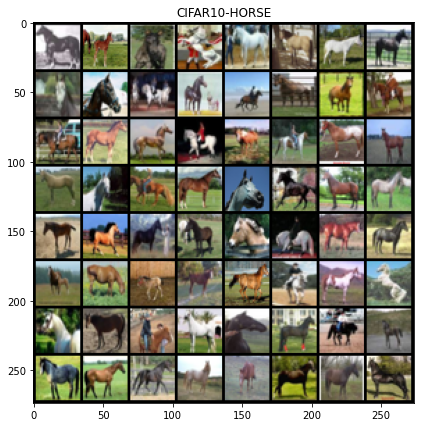

In [7]:
for image, _ in train_loader:
    plt.figure(figsize = (7,7))
    plt.title('CIFAR10-HORSE')
    plt.imshow(make_grid(image, normalize=True).permute(1,2,0))
    break

1th epoch, training loss mean:-3842.529510498047
1th epoch, val loss mean:-3842.529510498047
2th epoch, training loss mean:-5091.102112676056
2th epoch, val loss mean:-5091.102112676056
3th epoch, training loss mean:-5562.517248019366
3th epoch, val loss mean:-5562.517248019366
4th epoch, training loss mean:-5941.696887378961
4th epoch, val loss mean:-5941.696887378961
5th epoch, training loss mean:-6183.56513396787
5th epoch, val loss mean:-6183.56513396787
6th epoch, training loss mean:-6360.358535981514
6th epoch, val loss mean:-6360.358535981514
7th epoch, training loss mean:-6513.093701859595
7th epoch, val loss mean:-6513.093701859595
8th epoch, training loss mean:-6648.168910926496
8th epoch, val loss mean:-6648.168910926496
9th epoch, training loss mean:-6725.93564315581
9th epoch, val loss mean:-6725.93564315581
10th epoch, training loss mean:-6868.066103653169
10th epoch, val loss mean:-6868.066103653169
11th epoch, training loss mean:-6958.443710112236
11th epoch, val loss m

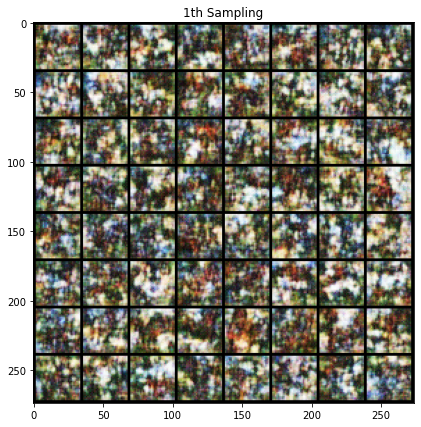

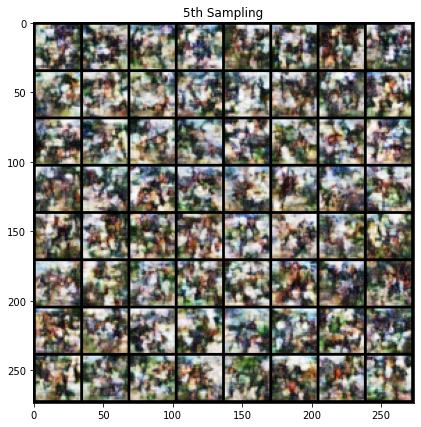

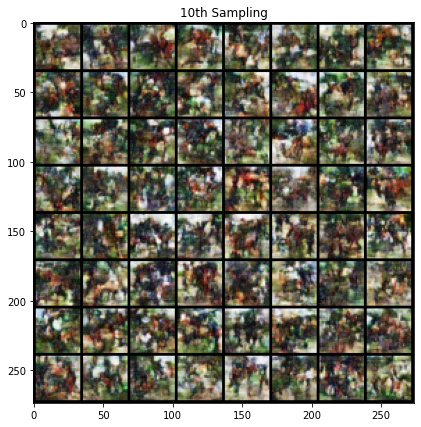

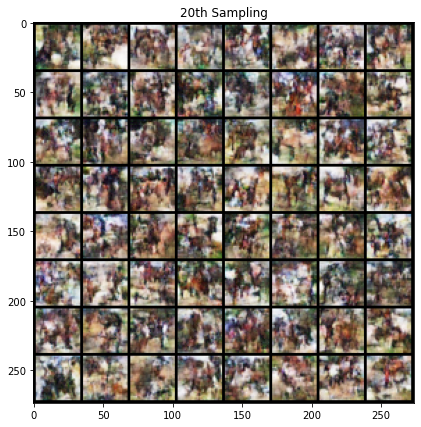

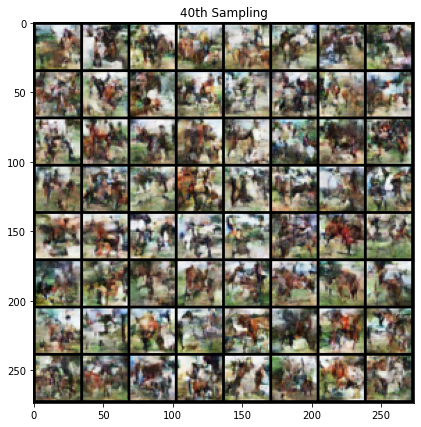

...

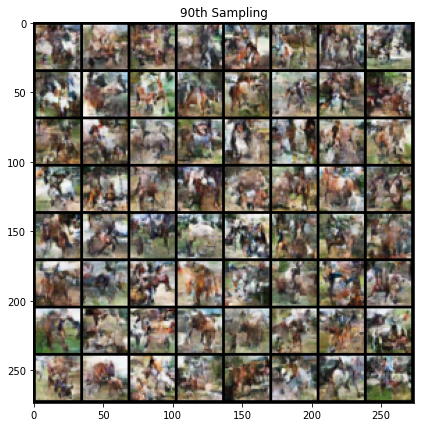

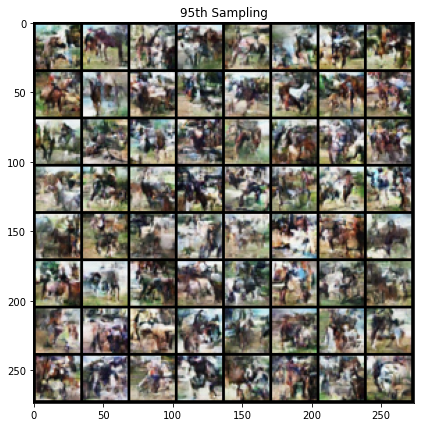

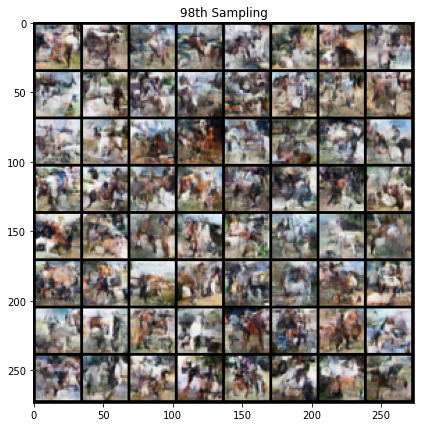

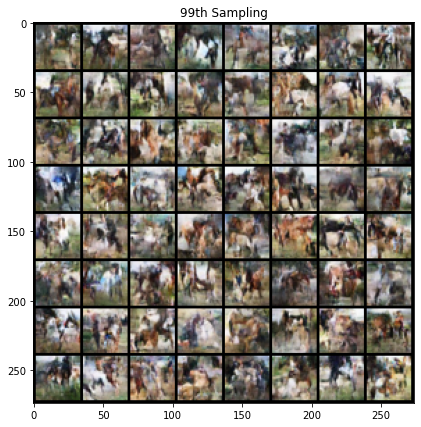

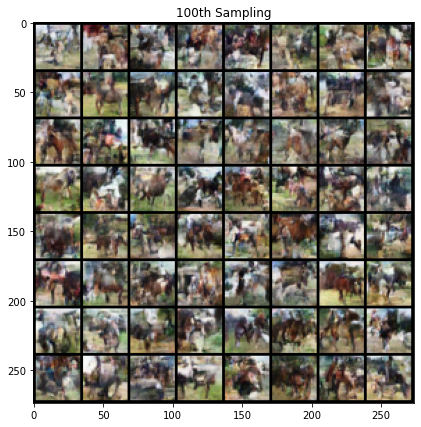

In [8]:
##############################
# STEP 5: Training the model #
##############################

flow = RealNVP().to(device)
optimizer = optim.Adamax(flow.parameters(), lr=learning_rate, betas=(0.9, 0.999), eps=1e-7)

epoch = 0
for i in range(epochs):
    train_loss_mean = 0
    epoch += 1
    flow.train()
    for batch_idx, data in enumerate(train_loader, 1):
        optimizer.zero_grad()
        x, _ = data
        # log-determinant of Jacobian from the logit transform
        x, log_det = logit_transform(x)
        x = x.to(device)
        log_det = log_det.to(device)

        log_ll = flow(x)
        log_ll = (log_ll + log_det).mean()

        loss = -log_ll
        train_loss_mean += loss.item()

        loss.backward()
        optimizer.step()
    
    train_loss_mean = train_loss_mean / batch_idx
    print("{}th epoch, training loss mean:{}".format(epoch, train_loss_mean))

    # validation
    flow.eval()
    val_loss_mean = 0
    with torch.no_grad():
        for batch_idx, data in enumerate(val_loader, 1):
            x, _ = data
            x, log_det = logit_transform(x)
            x = x.to(device)
            log_det = log_det.to(device)

            log_ll = flow(x)
            log_ll = (log_ll + log_det).mean()

            loss = -log_ll
            val_loss_mean += loss.item()
    
    val_loss_mean = val_loss_mean / batch_idx
    print("{}th epoch, val loss mean:{}".format(epoch, train_loss_mean))
    samples = flow.sample(batch_size)
    samples, _ = logit_transform(samples, reverse=True)
    save_image(samples, '{}th_epoch_output.png'.format(epoch))
    
    if epoch in [1,5,10,20,40,60,80,90,95,98,99,100]:
        plt.figure(figsize = (7,7))
        plt.title('{}th Sampling'.format(epoch))
        plt.imshow(make_grid(samples.cpu(), normalize=True).permute(1,2,0))

# VAE (CIFAR-horse)

In [1]:
import torch.nn as nn
import torch.functional as F
import torch
from torchvision import datasets, utils, transforms
import torch.optim as optim
from torchvision.utils import save_image, make_grid

import numpy as np
import matplotlib.pyplot as plt

In [2]:
epochs = 200
batch_size = 256
lr = 1e-04
device = torch.device('cuda:2')
latent_dim = 16
label = 7

In [3]:
##########################
# STEP 1: Define dataset #
##########################
transform = transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), transforms.ToTensor()])


def CIFAR10_subset(root, train, download, transform, target):
    CIFAR10 = datasets.CIFAR10(root=root, train=train, download=download, transform=transform)
    bool_targets = [idx==target for idx in CIFAR10.targets]
    index = [i for i, x in enumerate(bool_targets) if x]
    CIFAR10.data = [CIFAR10.data[idx] for idx in index]
    CIFAR10.targets = index
    return CIFAR10

trainset = CIFAR10_subset('./', True, True, transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), transforms.ToTensor()]), 7)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

Files already downloaded and verified


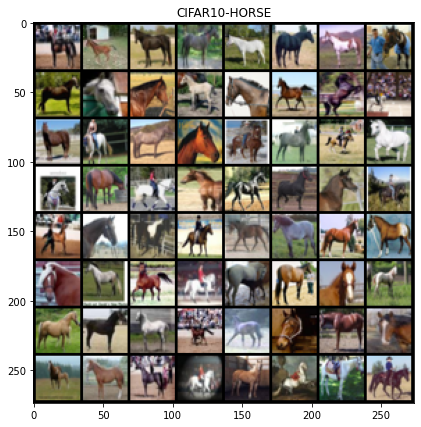

In [4]:
'''
Visualize CIFAR10-HORSE
'''

for image, _ in train_loader:
    plt.figure(figsize = (7,7))
    plt.title('CIFAR10-HORSE')
    plt.imshow(make_grid(image[:64], normalize=True).permute(1,2,0))
    break

In [5]:
####################################
# STEP 2: Define encoder & decoder #
####################################

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(3, 32, 3, stride=1, padding=1),
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(32, 64, 3, stride=2, padding=1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(64, 128, 3, stride=2, padding=1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(128, 256, 3, stride=2, padding=1),    
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(256, 256, 3, stride=1, padding=1),    
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU())
        self.fc = nn.Sequential(nn.Linear(256*4*4, 2*latent_dim),
                                nn.LeakyReLU())

                
    def forward(self,x):
        z = self.conv(x)
        z = z.view(z.shape[0], -1)
        z = self.fc(z)
        mu = z[:, :latent_dim]
        log_std = z[:, latent_dim:]
        return mu, log_std

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.fc = nn.Sequential(nn.Linear(latent_dim, 4*4*128),                          
                                nn.LeakyReLU())
        self.conv = nn.Sequential(nn.ConvTranspose2d(128, 128, 4, stride=2, padding=1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(),
                                  nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(),       
                                  nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), 
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(),       
                                  nn.Conv2d(32, 3, 3, padding=1))
                
    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 128, 4, 4)
        out = self.conv(out)
        return out

In [6]:
##################################################
# STEP 3: Instantiate model & define other utils #
##################################################


# Instantiating Encoder and Decoder
Encoder = Encoder().to(device)
Decoder = Decoder().to(device)


# optimizer
optimizer = optim.Adam(list(Encoder.parameters()) + list(Decoder.parameters()), lr=lr, weight_decay=4e-03)


# log_p_theta_(z|x) (reconstruction loss)
def log_p(x_hat, x):
    mse = nn.MSELoss().to(device)
    return -mse(x_hat, x)

# reparametrization trick
def reparametrization_trick(mu, log_std):
    z = torch.randn_like(mu)*log_std.exp()+mu
    return z

def kl_div(mu, log_std):
    kl = -log_std - 0.5 + (torch.exp(2 * log_std) + mu ** 2) * 0.5
    kl = kl.sum(1).mean()
    return kl

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


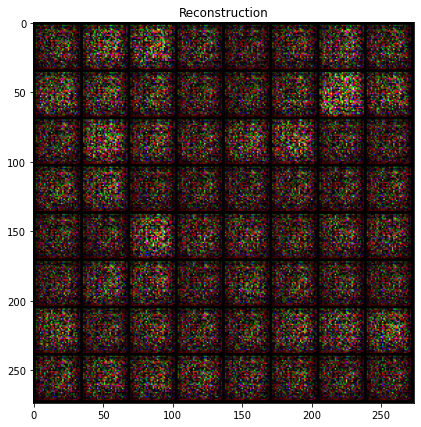

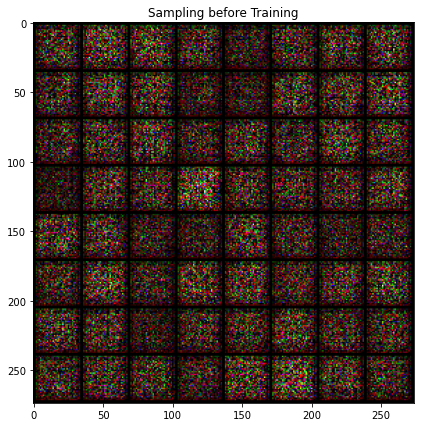

In [7]:
'''
Visualize reconstructed image & sampled image BEFORE TRAINING
'''

for i, data in enumerate(train_loader,1):   
    inputs, _ = data
    inputs = inputs.to(device)
    break
    
with torch.no_grad():
    mu, log_std = Encoder(inputs)
    x_hat = Decoder(mu)
    
    z = torch.randn_like(mu)
    samples = Decoder(z)
    save_image(x_hat[:64], "before_training_reconstruction.png")
    save_image(samples, "before_training_sample.png")
    
    plt.figure(figsize = (7,7))
    plt.title('Reconstruction')
    plt.imshow(make_grid(x_hat[:64].cpu()).permute(1,2,0))

    plt.figure(figsize = (7,7))
    plt.title('Sampling before Training')
    plt.imshow(make_grid(samples[:64].cpu()).permute(1,2,0))

<ipython-input-11-dd9d38a3ecef>:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (7,7))


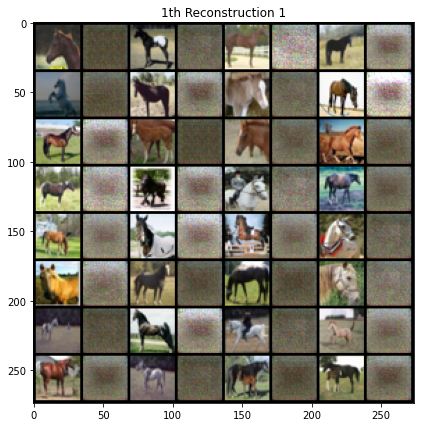

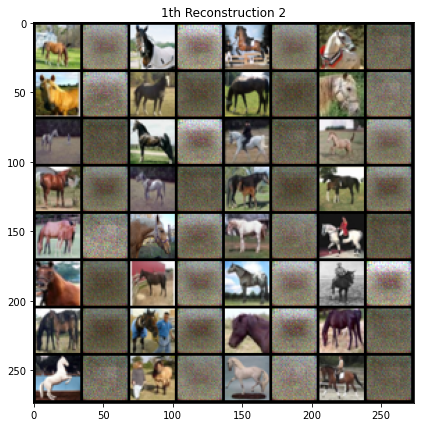

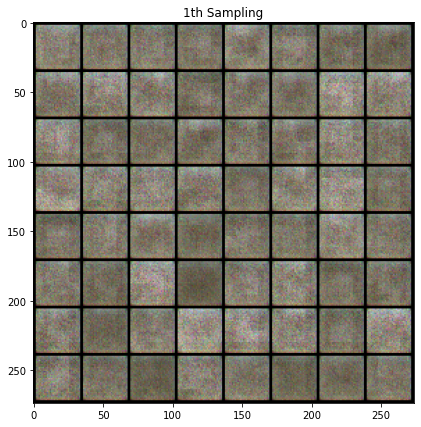

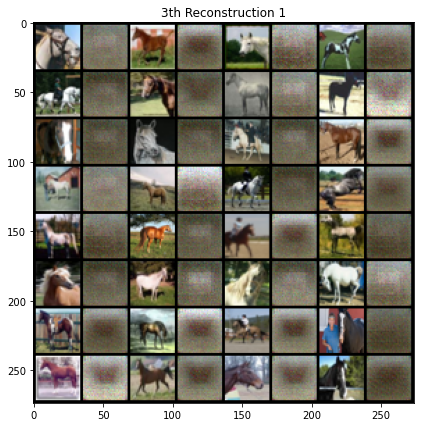

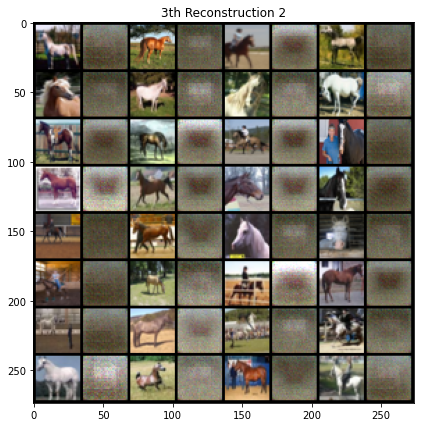

...

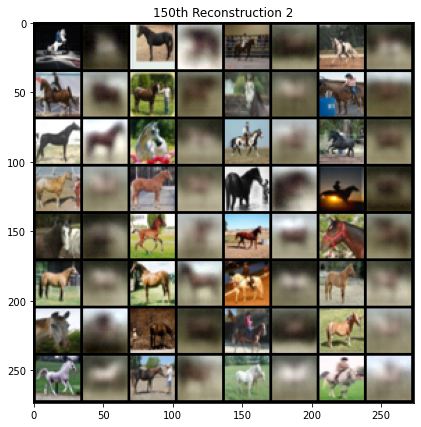

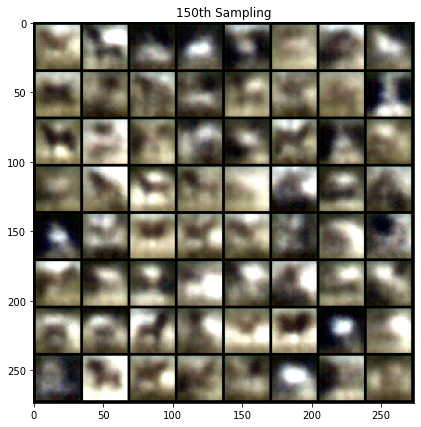

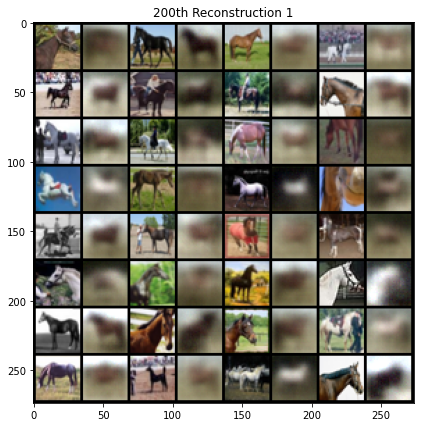

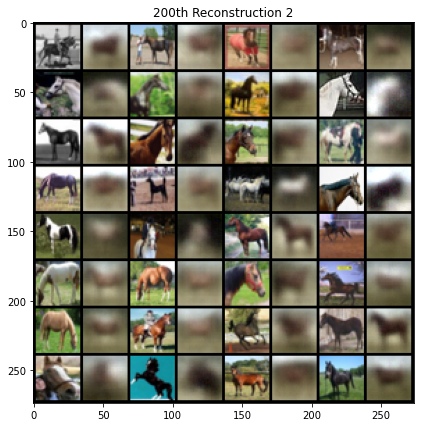

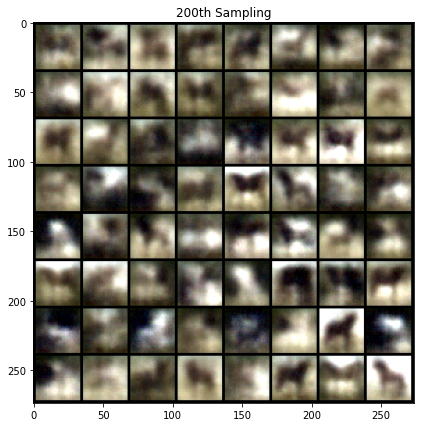

In [11]:
####################
# STEP 1: Training #
####################
for epoch_idx in range(1,epochs+1):
    for batch_idx, (img, _) in enumerate(train_loader):
        x = img.detach().to(device)
        mu, log_std = Encoder(x)
        z = reparametrization_trick(mu, log_std)
        x_hat = Decoder(z)

        x = x.view(x.shape[0], -1)
        x_hat = x_hat.view(x_hat.shape[0], -1)
        recon_loss = -log_p(x_hat, x)
        regularizer = kl_div(mu, log_std)

        loss = recon_loss*5000 + regularizer

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        print(f"[Epoch {epoch_idx:3d}] Processing batch #{batch_idx:3d} reconstruction loss: {recon_loss.item():.6f} regularization loss {regularizer.item():.6f} train_loss: {loss.item():.6f}", end='\r')

    if epoch_idx in [1,3,5,10,50,100,150,200]:
        for batch_idx, (img, _) in enumerate(train_loader):
            x = img.detach().to(device)
            mu, log_std = Encoder(x)
            x_hat = Decoder(mu)
            
            img_1 = torch.zeros(64, 3, 32, 32)
            img_2 = torch.zeros(64, 3, 32, 32)
            
            for i in range(0,32):
                img_1[2*i] = x[2*i]
                img_1[2*i+1] = x_hat[2*i]

                img_2[2*i] = x[32+2*i]
                img_2[2*i+1] = x_hat[32+2*i]
                
            save_image(img_1, '{}_th_recon_1.png'.format(epoch_idx))
            save_image(img_2, '{}_th_recon_2.png'.format(epoch_idx))

            z = torch.randn_like(mu)
            sample = Decoder(z)
            sample = sample.view(x.shape[0],3,32,32)
            save_image(sample[:64], '{}_th_sample.png'.format(epoch_idx))

            plt.figure(figsize = (7,7))
            plt.title('{}th Reconstruction 1'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(img_1.cpu(), min=0, max=1)).permute(1,2,0))

            plt.figure(figsize = (7,7))
            plt.title('{}th Reconstruction 2'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(img_2.cpu(), min=0, max=1)).permute(1,2,0))

            plt.figure(figsize = (7,7))
            plt.title('{}th Sampling'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(sample[:64].cpu(), min=0, max=1)).permute(1,2,0))
            break

[1/200]: loss_d: 0.473, loss_g: 5.035
[2/200]: loss_d: 0.488, loss_g: 7.098
[3/200]: loss_d: 0.656, loss_g: 3.633
[4/200]: loss_d: 0.442, loss_g: 3.545
[5/200]: loss_d: 0.338, loss_g: 3.617
[6/200]: loss_d: 0.338, loss_g: 4.013
[7/200]: loss_d: 0.380, loss_g: 3.770
[8/200]: loss_d: 0.459, loss_g: 3.272
[9/200]: loss_d: 0.508, loss_g: 2.915
[10/200]: loss_d: 0.597, loss_g: 2.664
[11/200]: loss_d: 0.611, loss_g: 2.488
[12/200]: loss_d: 0.680, loss_g: 2.259
[13/200]: loss_d: 0.676, loss_g: 2.230
[14/200]: loss_d: 0.714, loss_g: 2.148
[15/200]: loss_d: 0.799, loss_g: 1.904
[16/200]: loss_d: 0.804, loss_g: 1.879
[17/200]: loss_d: 0.820, loss_g: 1.871
[18/200]: loss_d: 0.830, loss_g: 1.792
[19/200]: loss_d: 0.799, loss_g: 1.876
[20/200]: loss_d: 0.868, loss_g: 1.741
[21/200]: loss_d: 0.882, loss_g: 1.689
[22/200]: loss_d: 0.895, loss_g: 1.649
[23/200]: loss_d: 0.881, loss_g: 1.715
[24/200]: loss_d: 0.909, loss_g: 1.630
[25/200]: loss_d: 0.925, loss_g: 1.550
[26/200]: loss_d: 0.959, loss_g: 1

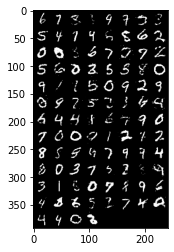

In [16]:
#Generative Adverserial Networks (MNIST)

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

'''
Step 1
'''

# MNIST Dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))])

train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transform, download=True)

bs = 100
# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=bs, shuffle=True)

'''
Step 2
'''

class Generator(nn.Module):
    def __init__(self, g_input_dim, g_output_dim):
        super(Generator, self).__init__()       
        self.fc1 = nn.Linear(g_input_dim, 256)
        self.fc2 = nn.Linear(self.fc1.out_features, self.fc1.out_features*2)
        self.fc3 = nn.Linear(self.fc2.out_features, self.fc2.out_features*2)
        self.fc4 = nn.Linear(self.fc3.out_features, g_output_dim)
    
    # forward method
    def forward(self, x): 
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        return torch.tanh(self.fc4(x))
    
class Discriminator(nn.Module):
    def __init__(self, d_input_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(d_input_dim, 1024)
        self.fc2 = nn.Linear(self.fc1.out_features, self.fc1.out_features//2)
        self.fc3 = nn.Linear(self.fc2.out_features, self.fc2.out_features//2)
        self.fc4 = nn.Linear(self.fc3.out_features, 1)
    
    # forward method
    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.dropout(x, 0.3)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.dropout(x, 0.3)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = F.dropout(x, 0.3)
        return torch.sigmoid(self.fc4(x))
    


'''
Step 3-1
'''

z_dim = 100

G = Generator(g_input_dim = z_dim, g_output_dim = 28*28).to(device)
D = Discriminator(28*28).to(device)

G_optimizer = optim.Adam(G.parameters(), lr = 0.0002)
D_optimizer = optim.Adam(D.parameters(), lr = 0.0002)


'''
Step 4
'''

import time
start = time.time()

n_epoch = 200

for epoch in range(1, n_epoch+1):           
    D_losses, G_losses = [], []
    for x, _ in train_loader:
        D.zero_grad()

        x_real = x.view(-1, 28*28).to(device)
        D_real_loss = torch.mean(torch.log(D(x_real)))
        Z = torch.randn(bs, z_dim).to(device)
        D_fake_loss = torch.mean(torch.log(1-D(G(Z))))
        D_loss = -(D_real_loss + D_fake_loss)
        D_loss.backward()
        D_optimizer.step()
        D_losses.append(D_loss.data.item())
        
        G.zero_grad()
        Z = torch.randn(bs, z_dim).to(device)
        #G_loss = torch.mean(torch.log(1-D(G(Z))))
        #following heuristic maximizes log(D(G(Z))) instead of minimizing log(1-D(G(Z)))
        G_loss = -torch.mean(torch.log(D(G(Z))))
        G_loss.backward()
        G_optimizer.step()
        G_losses.append(G_loss.data.item())

    print('[%d/%d]: loss_d: %.3f, loss_g: %.3f' % (epoch, n_epoch, torch.mean(D_losses), torch.mean(G_losses)))

end = time.time()
print("Time ellapsed in training is: {}".format(end - start))

'''
Step 5
'''

with torch.no_grad():
    generated = G(torch.randn(bs, z_dim).to(device))

    save_image(generated.view(generated.size(0), 1, 28, 28), 'sample_' + '.png')

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
img = mpimg.imread('sample_.png')
plt.imshow(img)
plt.show()

# Generative Adverserial Networks (MNIST)

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

'''
Step 1
'''

# MNIST Dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))])

train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transform, download=True)

bs = 100
# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=bs, shuffle=True)

'''
Step 2
'''

class Generator(nn.Module):
    def __init__(self, g_input_dim, g_output_dim):
        super(Generator, self).__init__()       
        self.fc1 = nn.Linear(g_input_dim, 256)
        self.fc2 = nn.Linear(self.fc1.out_features, self.fc1.out_features*2)
        self.fc3 = nn.Linear(self.fc2.out_features, self.fc2.out_features*2)
        self.fc4 = nn.Linear(self.fc3.out_features, g_output_dim)
    
    # forward method
    def forward(self, x): 
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        return torch.tanh(self.fc4(x))
    
class Discriminator(nn.Module):
    def __init__(self, d_input_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(d_input_dim, 1024)
        self.fc2 = nn.Linear(self.fc1.out_features, self.fc1.out_features//2)
        self.fc3 = nn.Linear(self.fc2.out_features, self.fc2.out_features//2)
        self.fc4 = nn.Linear(self.fc3.out_features, 1)
    
    # forward method
    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.dropout(x, 0.3)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.dropout(x, 0.3)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = F.dropout(x, 0.3)
        return torch.sigmoid(self.fc4(x))
    


'''
Step 3-1
'''

z_dim = 100

G = Generator(g_input_dim = z_dim, g_output_dim = 28*28).to(device)
D = Discriminator(28*28).to(device)

G_optimizer = optim.Adam(G.parameters(), lr = 0.0002)
D_optimizer = optim.Adam(D.parameters(), lr = 0.0002)


'''
Step 4
'''

import time
start = time.time()

n_epoch = 200

for epoch in range(1, n_epoch+1):           
    D_losses, G_losses = [], []
    for x, _ in train_loader:
        D.zero_grad()

        x_real = x.view(-1, 28*28).to(device)
        D_real_loss = torch.mean(torch.log(D(x_real)))
        Z = torch.randn(bs, z_dim).to(device)
        D_fake_loss = torch.mean(torch.log(1-D(G(Z))))
        D_loss = -(D_real_loss + D_fake_loss)
        D_loss.backward()
        D_optimizer.step()
        D_losses.append(D_loss.data.item())
        
        G.zero_grad()
        Z = torch.randn(bs, z_dim).to(device)
        G_loss = -torch.mean(torch.log(D(G(Z))))
        G_loss.backward()
        G_optimizer.step()
        G_losses.append(G_loss.data.item())

    print('[%d/%d]: loss_d: %.3f, loss_g: %.3f' % (epoch, n_epoch, torch.mean(D_losses), torch.mean(G_losses)))

end = time.time()
print("Time ellapsed in training is: {}".format(end - start))

'''
Step 5
'''

with torch.no_grad():
    generated = G(torch.randn(bs, z_dim).to(device))

    save_image(generated.view(generated.size(0), 1, 28, 28), 'sample_' + '.png')

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
img = mpimg.imread('sample_.png')
plt.imshow(img)
plt.show()